# 2021-04-06

- Time-averaging Zelda and Bicoid clusters
- Zelda enrichment at MS2 spots
- Burst analysis
    - Triggered averaging
    - Derivatives
    - Modulating integration volumes
    - Cross-correlations

In [1]:
# Import public packages.
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from scipy import ndimage as ndi 
from importlib import reload
import pickle
import czifile
import imageio
from skimage.filters.thresholding import threshold_otsu

# The order of loading matplotlib is important to avoid issues on my machine.
%matplotlib inline
import matplotlib as mpl
#%matplotlib notebook
#%matplotlib notebook

# Import my packages.
import sys
sys.path.append('/Users/michaelstadler/Bioinformatics/Projects/rpb1/bin')
import imagep as imp
reload(imp)
from imagep import viewer, save_pickle, load_pickle, box_spots, read_czi

## Revisiting Zelda and Bicoid clusters

Doing some time averaging of old lattice movies for the Garcia crew.

In [5]:
stack = imp.read_tiff_lattice('/Volumes/Stadler_ima/2018_03_13_ZeldaNeon_MS2/zld_hb/fast/em5_2')

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

In [10]:
def simple_bleach_corr(x):
    grand_mean = np.mean(x)
    x_corr = x.copy()
    for n in range(0, x.shape[0]):
        denom = np.percentile(x[n], 90)
        x_corr[n] = x[n] / denom * grand_mean
    return x_corr
        

In [31]:
def running_avg(stack, winlen, stepsize):
    newstack = np.zeros_like(stack[:1])
    for n in range(0, stack.shape[0], stepsize):
        print(n, end=' ')
        newframe = stack[n:(n+winlen+1)].mean(axis=0)
        newstack = np.vstack((newstack, [newframe]))
    return newstack[1:]

In [11]:
a = simple_bleach_corr(stack[1])

In [37]:
b = running_avg(a, 10,4)

0 4 8 12 16 20 24 28 32 36 40 44 48 52 56 60 64 68 72 76 80 84 88 92 96 100 104 108 112 116 120 124 128 132 136 140 144 148 152 156 160 164 168 172 176 180 184 188 192 196 200 204 208 212 216 220 224 228 232 236 240 244 248 252 256 260 264 268 272 276 280 284 288 292 296 300 304 308 312 316 320 324 328 332 336 340 344 348 352 356 360 364 368 372 376 380 384 388 392 396 400 404 408 412 416 420 424 428 432 436 440 444 448 452 456 460 464 468 472 476 480 484 488 492 496 500 504 508 512 516 520 524 528 532 536 540 544 548 552 556 560 564 568 572 576 580 584 588 592 596 600 604 608 612 616 620 624 628 632 636 640 644 648 652 656 660 664 668 672 676 680 684 688 692 696 700 704 708 712 716 720 724 728 732 736 740 744 748 752 756 760 764 768 772 776 780 784 788 792 796 800 804 808 812 816 820 824 828 832 836 840 844 848 852 856 860 864 868 872 876 880 884 888 892 896 900 904 908 912 916 920 924 928 932 936 940 944 948 952 956 960 964 968 972 976 980 984 988 992 996 1000 1004 1008 1012 1016 102

In [38]:
imageio.mimsave('/Users/michaelstadler/Documents/presentations/misc/20210423-TFEnr/zld_fast_10_4.tiff', b)

In [39]:
stack2 = imp.read_tiff_lattice('/Volumes/Stadler_ima/2018_02_14_ZLDBCD/5f')

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781: coercing invalid ASCII to bytes
TiffTag 32781

In [46]:
a = simple_bleach_corr(stack2[1])

In [47]:
viewer(a)

interactive(children=(Dropdown(description='Color', index=10, options=('viridis', 'gray_r', 'magma', 'inferno'…

In [49]:
b = running_avg(a, 3,1)

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 

In [54]:
imageio.mimsave('/Users/michaelstadler/Documents/presentations/misc/20210423-TFEnr/bcd-fast-3-1.tiff', b.astype('uint16'))

## Zelda enrichment at MS2 spots

In [378]:
def collapse_t(x):
    """collapse all frames of spot movie into a single 3D array"""
    new_size = tuple([x.shape[0] * x.shape[1]]) + x.shape[-3:]
    return x.reshape(new_size)

In [379]:
def combine_spot_movies(mv_filenames, channel=0, len_ij=31, len_z=5):
    """Combine spot movies from multiple movie obect files."""
    list_ = []
    for f in mv_filenames:
        mv = load_pickle(f) 
        spots_temp = collapse_t(imp.spot_movies(mv.stack, mv.spot_data, 
            channel=channel, fill=0, view=False, len_ij=len_ij, len_z=len_z))
        list_.append(spots_temp)
    
    spots = list_[0]
    for i in range(1, len(list_)):
        spots = np.vstack((spots, list_[i]))
    
    return spots
        

Zld enrichment at hb transcription sites

In [380]:
mv_filenames = [
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-hbms2-zsmv-em1-06-07.pkl',
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-hbms2-zsmv-em1-08-09.pkl',
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-hbms2-zsmv-em2-04-05.pkl'
]

spots_r_hb = combine_spot_movies(mv_filenames, 0)
spots_m_hb = combine_spot_movies(mv_filenames, 1)

In [381]:
viewer([spots_r_hb.mean(axis=(0,1)), spots_m_hb.mean(axis=(0,1))], 4, color='cividis')

interactive(children=(Dropdown(description='Color', index=4, options=('viridis', 'gray', 'inferno', 'gray_r', …

In [382]:
# eve txn sites.
mv_filenames = [
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210212-mneonzld-eveBAC-em2-zsmv-05.pkl',
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210212-mneonzld-eveBAC-em2-zsmv-06.pkl',
]

spots_r_eve = combine_spot_movies(mv_filenames, 0)
spots_m_eve = combine_spot_movies(mv_filenames, 1)
spots_r_eve.shape

(3072, 5, 31, 31)

In [383]:
viewer([spots_r_eve[:,1:4].mean(axis=(0,1)), spots_m_eve[:,1:4].mean(axis=(0,1))], 4, color='cividis')

interactive(children=(Dropdown(description='Color', index=4, options=('viridis', 'gray', 'inferno', 'gray_r', …

In [384]:
# sisA
mv_filenames = [
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-sisAms2-zsmv-em1-01-02.pkl',
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-sisAms2-zsmv-em1-04.pkl',
]

spots_r_sisA = combine_spot_movies(mv_filenames, 0)
spots_m_sisA = combine_spot_movies(mv_filenames, 1)
spots_r_sisA.shape

(746, 5, 31, 31)

In [385]:
viewer([spots_r_sisA[:,1:4].mean(axis=(0,1)), spots_m_sisA[:,1:4].mean(axis=(0,1))], 4, color='cividis')

interactive(children=(Dropdown(description='Color', index=4, options=('viridis', 'gray', 'inferno', 'gray_r', …

In [386]:
# hb using only early cycle movies where most of the nuclear cycle is prophase.
mv_filenames = [
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-hbms2-zsmv-em1-04.pkl',
    '/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210402-mNeonZld-hbms2-zsmv-em1-05.pkl',
]

spots_r_hbearly = combine_spot_movies(mv_filenames, 0)
spots_m_hbearly = combine_spot_movies(mv_filenames, 1)

In [387]:
viewer([spots_r_hbearly[:,1:4].mean(axis=(0,1)), spots_m_hbearly[:,1:4].mean(axis=(0,1))], 4, color='cividis')

interactive(children=(Dropdown(description='Color', index=4, options=('viridis', 'gray', 'inferno', 'gray_r', …

## Thoughts

The eve enrichment is the most believable thing here, especially contrasted with the lack of enrichment for hb. That's probably a good result. I have a ton of data for eve, including multiple movies I didn't process for inclusion here. I could use more good nc12/13/early14 movies for hunchback, just to boost the numbers and be sure. 

sisA is a bit more complicated. It seems to only really be expressed well early, and dies at either 13 or 14. This means that it's very hard to get movies of sisA dots that don't overlap with prophase, complicating the situation because Zelda clings to condensed chromatin in prophase and could give a spurious enrichment. The best "control" I had was to look at an early hb dataset that overlaps substantially with prophase. This result is presently inconclusive. I need some more data:

- Early cycle hunchback (prophasey, for comparison to sisA)
- Mid cycle hunchback(not prophasey, for comparison to eve)
- More early cycle sisA

## Bursting analysis

Trying to revisit bursting analysis using some recent movies I took with Rpb1-GFP and the new (improved?) 2xNos-MCP-mcherry. I have one extremely long dataset for snail and two good sets for hb.

In [2]:
sna_em3 = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210412-Rpb1GFP-snaMS2-zsmv-em3-04-08.czi.pkl')

hb_em1 = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210311-Rpb1GFP-HbMS2-em1-zsmv-03-07.pkl')

hb_em2 = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210311-Rpb1GFP-HbMS2-em2-zsmv-01-04.pkl')



In [293]:
def df_filter_trajlen(df, minlen, renumber=False):
    """Filter pandas df columns for minimum number of non-nan entries."""
    new_df =  df.loc[:,df.apply(lambda x: np.count_nonzero(~np.isnan(x)), axis=0) > minlen]
    if (renumber):
        new_df.columns = np.arange(1, len(new_df.columns) + 1)
    return new_df

In [537]:
def bleach_corr(df, stack4d, sigma=10):
    """Perform bleach correction using the (smoothed) frame average of 
    the rpb1 channel, apply to columns of a pandas df."""
    frame_means = np.mean(stack4d, axis=(1,2,3))
    frame_means_smooth = ndi.gaussian_filter(frame_means, sigma=sigma)
    means_norm = frame_means_smooth / frame_means_smooth[0]
    return df.apply(lambda x: x / means_norm, axis=0)
#df_corr = bleach_corr(sna_em3.intvol, sna_em3.stack[1])

In [28]:
"""
def plot_traces(mv, minlen, sigma=0.8):
    """Plot individual traces with smoothing, bleach correction, and 
    a minimum trajectory length filter."""
    df1 = df_filter_trajlen(bleach_corr(mv.intvol, mv.stack[0]), minlen)
    df2 = df_filter_trajlen(bleach_corr(mv.prot, mv.stack[0]), minlen)
    #df2 = df1
    num_to_plot=df1.shape[1]
    def test(x):
        plt.plot(ndi.gaussian_filter1d(df1.iloc[:,x] / np.mean(df1.iloc[:,x]), sigma))
        plt.plot(ndi.gaussian_filter1d(df2.iloc[:,x] / np.mean(df2.iloc[:,x]), sigma))
        plt.title(x)
    imp.plot_ps(test, range(1,num_to_plot))
"""
    
def plot_traces(mv, minlen, sigma=0.8, norm=True):
    """Plot individual traces with smoothing, bleach correction, and 
    a minimum trajectory length filter."""
    def norm_trace(df, x, lower, upper):
        return (df.iloc[:,x] - lower) / (upper - lower)
    
    df_intvol = df_filter_trajlen(bleach_corr(mv.intvol, mv.stack[0]), minlen)
    df_prot = df_filter_trajlen(bleach_corr(mv.prot, mv.stack[0]), minlen)
    intvol_lower, intvol_upper = np.nanpercentile(mv.intvol.to_numpy().flatten(), [5, 95])
    prot_lower, prot_upper = np.nanpercentile(mv.prot.to_numpy().flatten(), [5, 95])
    #df2 = df1
    num_to_plot=df_intvol.shape[1]
    def test(x):
        plt.plot(ndi.gaussian_filter1d(norm_trace(df_intvol, x, intvol_lower, intvol_upper), sigma))
        plt.plot(ndi.gaussian_filter1d(norm_trace(df_prot, x, prot_lower, prot_upper), sigma))
        plt.title(x)
    imp.plot_ps(test, range(1,num_to_plot))

In [45]:
imp.quickview_ms2(sna_em3.stack, sna_em3.spot_data, 0, 12, MAX=False, spot_id=14, halfwidth_z=1)

interactive(children=(Dropdown(description='Color', index=2, options=('magma', 'gray', 'cividis', 'viridis', '…

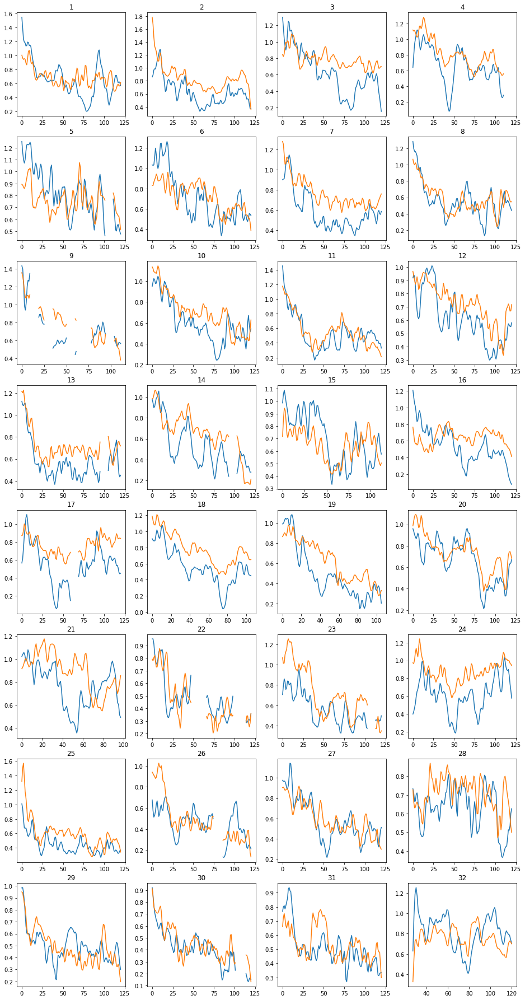

In [29]:
plot_traces(sna_em3, 100, 1)

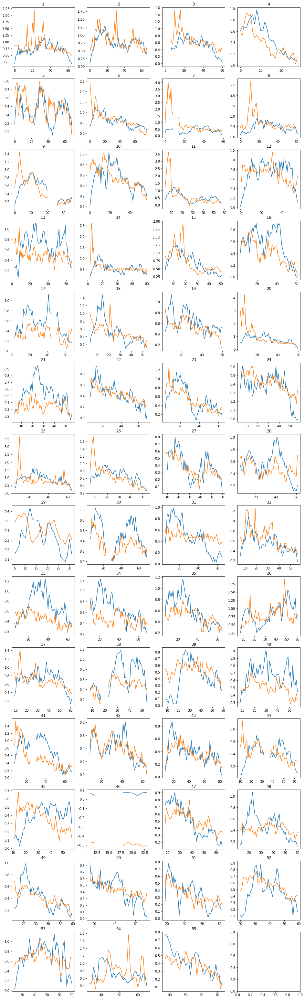

In [30]:
plot_traces(hb_em2, 30, 0.5)

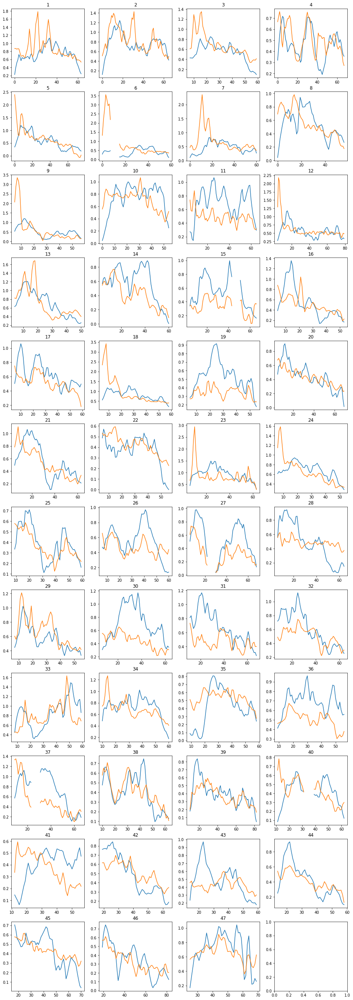

In [31]:
plot_traces(hb_em2, 50, 0.8)

In [10]:
from scipy.optimize import curve_fit

def abline(x, m, b):
    return (x * m) + b

<ipython-input-11-2c517bf4d18b>:10: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])


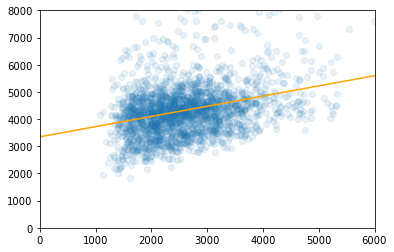

In [11]:
def plot_corr(mv,xlim=[0,6000], ylim=[0,8000], minlen=0, funct=lambda x: x):
    """Make scatterplot of protein vs. MS2 signals for individual spots and 
    timepoints, with bleach correction and an optional function applied to
    each column (e.g., smoothing, difference, etc.)."""
    x = bleach_corr(df_filter_trajlen(mv.intvol, minlen), mv.stack[0]).apply(funct).to_numpy().flatten()
    y = bleach_corr(df_filter_trajlen(mv.prot, minlen), mv.stack[0]).apply(funct).to_numpy().flatten()
    plt.scatter(x,y, alpha=0.1)
    plt.ylim(ylim)
    plt.xlim(xlim)
    (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])
    x1 = np.arange(-30000,30000)
    y1 = (x1 * m) + b
    plt.plot(x1, y1, color="orange")
   
plot_corr(hb_em1, [0,6000], [0, 8000], minlen=30)

<ipython-input-284-c3428dbd479f>:7: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])


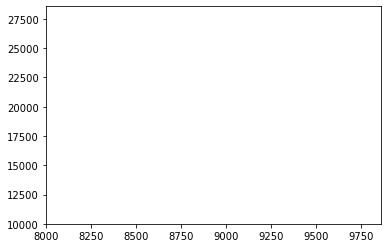

In [388]:
plot_corr(hb_em2, 8000, 10000, minlen=30)

<ipython-input-177-23c76aa4d5c7>:7: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(func, x[y < 10000], y[y < 10000])


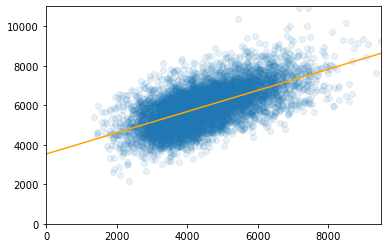

In [206]:
plot_corr(sna_em3, 9500, 11000, minlen=30)

<ipython-input-177-23c76aa4d5c7>:7: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(func, x[y < 10000], y[y < 10000])
<ipython-input-177-23c76aa4d5c7>:7: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(func, x[y < 10000], y[y < 10000])


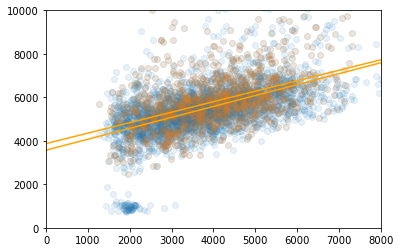

In [203]:
# Is this just inadequate bleaching correction?

#mv = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210412-Rpb1GFP-snaMS2-zsmv-em3-04-08.czi.pkl')
mv = imp.load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20210311-Rpb1GFP-HbMS2-em2-zsmv-01-04.pkl')
start=0
end=20
intvol_orig = mv.intvol.copy()
prot_orig = mv.prot.copy()
intvol_new = intvol_orig.iloc[:,start:end]
prot_new = prot_orig.iloc[:,start:end]
plot_corr(mv, 8000, 10000, minlen=1)
mv.intvol = intvol_new
mv.prot = prot_new
plot_corr(mv, 8000, 10000, minlen=1)
mv.intvol = intvol_orig
mv.prot = prot_orig
del mv

<ipython-input-284-c3428dbd479f>:7: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])


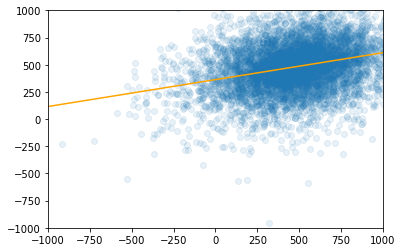

In [296]:
def temp(x):
    #x1 = ndi.gaussian_filter1d(x, 1.5)
    x1 = pd.Series(x)
    return  x1.rolling(3).mean().diff(1) + 500

plot_corr(sna_em3, [-1000,1000], [-1000, 1000],minlen=30, funct=temp)

<ipython-input-284-c3428dbd479f>:7: RuntimeWarning: invalid value encountered in less
  (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])


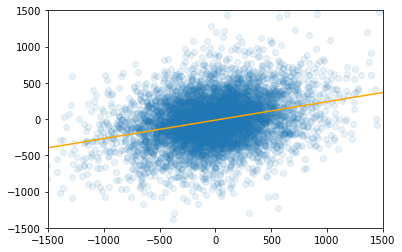

In [299]:
def temp(x):
    #x1 = ndi.gaussian_filter1d(x, 1.5)
    x1 = pd.Series(x)
    return x1.rolling(2).mean().diff(1)

plot_corr(sna_em3, [-1500,1500], [-1500, 1500],minlen=30, funct=temp)

OK, so we have messy data and are basically just looking for correlations. I suppose there are sophisticated things to do, but a simpler way to think about it is to look for signatures of pol2 behavior around different kinds of landmarks in the MS2 traces. Another thing to do is to try to predict one trace from the other. I'm not sure how to go about doing that. How about re-visiting cross-correlation?

In [353]:
from scipy.signal import correlate
def plot_crosscorr(mv,xlim=[0,6000], ylim=[0,8000], minlen=0, funct=lambda x: x, channel=0):
    x = bleach_corr(df_filter_trajlen(mv.intvol, minlen), mv.stack[channel]).apply(funct).to_numpy().flatten()
    y = bleach_corr(df_filter_trajlen(mv.prot, minlen), mv.stack[channel]).apply(funct).to_numpy().flatten()
    x[np.isnan(x)] = 0
    y[np.isnan(y)] = 0
    return x,y
    """
    plt.scatter(x,y, alpha=0.1)
    plt.ylim(ylim)
    plt.xlim(xlim)
    (m,b),_ = curve_fit(abline, x[y < 10000], y[y < 10000])
    x1 = np.arange(-30000,30000)
    y1 = (x1 * m) + b
    plt.plot(x1, y1, color="orange")
    """
x,y=plot_crosscorr(sna_em3)

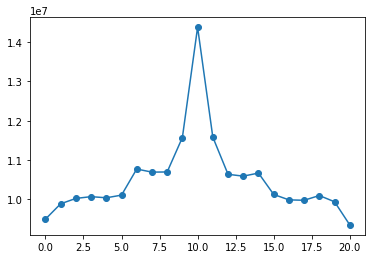

In [389]:
x,y=plot_crosscorr(sna_em3)
c=correlate(x,y)
width = 10
midpoint = int(c.shape[0] / 2)
start = midpoint - width
end = midpoint + width + 1
a = np.repeat(1, x.shape)
c0 = correlate(a,a)
c_norm = c / c0
plt.plot(c_norm[start:end], marker="o");

In the previous iteration I used random data for the normalizing data...which ends up looking prettier. Idk, there just doesn't seem to be a lot there unless I'm missing something. 

### Triggered averaging

Going to revisit some of the work I did previously for doing "triggered averaging" — averaging one signal around landmarks in the other channel.

In [86]:
# Import some previously written functions.

# Combine all traces.
def combine_intvols(mvs):
    def concat_dfs(a, b):
        def pad_df(small, big):
            pad = np.empty((len(big) - len(small), small.shape[1]))
            pad[:] = np.nan
            padded = np.concatenate([pad, small], axis=0)
            return padded
    
        if (len(a) < len(b)):
            a = pad_df(a, b)
        elif (len(b) < len(a)):
            b = pad_df(b, a)
    
        return np.concatenate([a,b], axis=1)
    
    mv = mvs[0]
    intvol = np.array(mv.intvol.copy())
    prot = np.array(mv.prot.copy())
    
    for mv in mvs[1:]:
        intvol = concat_dfs(intvol, mv.intvol)
        prot = concat_dfs(prot, mv.prot)

    return pd.DataFrame(intvol), pd.DataFrame(prot)

def interp_nan(x):
        """Replace internal NAs with values interpolated as the means of the 
        nearest non-NA values"""
        indexes_nan = np.where(np.isnan(x))[0]
        for i in indexes_nan:
            prev_valid = find_nearest_nonnan(x, i, -1)
            next_valid = find_nearest_nonnan(x, i, 1)
            x.iloc[i] = np.mean([prev_valid, next_valid])
        return x
    
def findrises(df, windowsize, lag, min_, max_, rise=True, norm=True, display=False):
    """Find points in signal where a 'rise' occurs of magnitude between min_ and max_.
    Change is calculated using means within windows of specified size and with offset
    defined by lag. If rise is false, will look for falls. Norm normalizes each spot's
    data 0 to 1."""
    events = []
    for spot in df:
        data = df[spot].copy()
        if (norm):
            data_norm = (data - data.min()) / (data.max() - data.min())
        else:
            data_norm = data
        rolling_avg = data_norm.rolling(windowsize, center=True).mean()
        diff = rolling_avg.diff(lag)
        
        if rise:
            indices = np.where((diff > min_) & (diff < max_))
        else:
            indices = np.where((diff < (-1 * min_)) & (diff > (-1 * max_)))
        
        """
        last_index = [0,0]
        for i in indices[0]:
            # In a run of consecutive indexes.
            if (last_index == [spot, i-1]):
                last_index = [spot, i]
            else:
                events.append([spot, i])
                last_index = [spot, i]
        """
        for i in indices[0]:
            events.append([spot, i])
            
    if display:
        nframes = df.shape[1]
        ax = imp.qax(nframes+1)

        for n in range(1, nframes-1):
            ax[n].plot(df[n])
            for event in events:
                if (event[0] == n):
                    pass
                    ax[n].axvline([event[1]], color="black", linestyle="--")
    print(len(events))
    return events

def plot_triggered(df1, df2, locs, norm=True):
    def norm_(x):
        return (x - x.min()) / (x.max() - x.min())
    
    df1_means = imp.align_traces(df1, locs, 25).mean()
    df2_means = imp.align_traces(df2, locs, 25).mean()
    if (norm):
        df1_means = norm_(df1_means);
        df2_means = norm_(df2_means);
    df1_means.plot()
    df2_means.plot()
    plt.axvline([12], color="black", linestyle="--");

def bootstrap_dfs(df1, df2, n):
    nframes = df1.shape[1]
    df1_bs = df1.iloc[:, np.random.randint(0, nframes - 1, n)]
    df1_bs.columns = np.arange(0,n)
    df2_bs = df2.iloc[:, np.random.randint(0, nframes - 1, n)]
    df2_bs.columns = np.arange(0,n)
    return df1_bs, df2_bs



In [456]:
intvols, prots = combine_intvols([sna_em3, hb_em1, hb_em2])

220


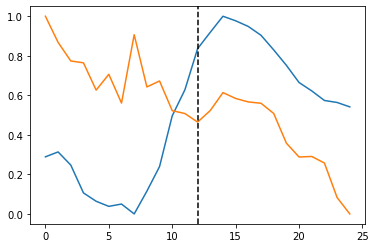

In [471]:
intvols_bs, prots_bs = bootstrap_dfs(intvols, prots, 150)
locs = findrises(intvols_bs, 5, 3, 0.20, np.inf, rise=True, norm=True, display=False)
plot_triggered(intvols_bs, prots_bs, locs)

### Interlude: integrating protein signal?

I want to revisit basic movie processing and figure out if using different radii makes a difference here, and also maybe try doing gaussian fitting with the protein channel. Pretty skeptical of the fitting, but it's an idea. I got annoyed at how slow this is. It turns out hte slow part is all the matrix operations (squaring, adding, etc.) happening on the whole stack. I re-wrote the add_volume_mean function to perform those operations only on the relevant sub-slices of the stack, which sped it WAY up. Testing the equivalence of the old and new versions:

In [522]:
mv = sna_em3
#orig = mv.spot_data.copy()

nucchannel = 0
ij_rad = 3
z_rad = 1.1
ij_scale = 1
z_scale = 1

spot_data_newversion = imp.add_volume_mean(mv.spot_data, mv.stack, nucchannel, ij_rad, z_rad, ij_scale, z_scale)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 

In [523]:
# Reverted to the old.
reload(imp)
mv = sna_em3
#orig = mv.spot_data.copy()

nucchannel = 0
ij_rad = 3
z_rad = 1.1
ij_scale = 1
z_scale = 1

spot_data_oldversion = imp.add_volume_mean(mv.spot_data, mv.stack, nucchannel, ij_rad, z_rad, ij_scale, z_scale)

1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 

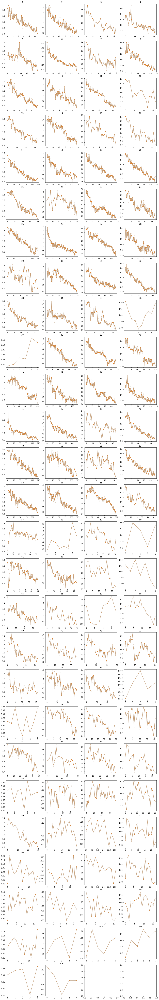

In [525]:
col1=11
col2=11
num_to_plot=len(spot_data)
def test(x):
    plt.plot(spot_data_oldversion[x][:,col1] / np.mean(spot_data_oldversion[x][:,col1]), marker=".", alpha=0.5) # volume integration in blue.
    plt.plot(spot_data_newversion[x][:,col2] / np.mean(spot_data_newversion[x][:,col2]),marker=".", alpha=0.5) # gaussian integration in orange.
    plt.title(x)
imp.plot_ps(test, range(1,num_to_plot+1))

They're exactly equivalent. Great success.

Test equivalence to old version:

In [529]:
mv = sna_em3
spot_data = mv.spot_data.copy()

In [534]:
reload(imp)
#orig = mv.spot_data.copy()

nucchannel = 0
ij_rad = 11
z_rad = 1.1
ij_scale = 1
z_scale = 1

spot_data = imp.add_volume_mean(spot_data, mv.stack, nucchannel, ij_rad, z_rad, ij_scale, z_scale)

10 20 30 40 50 60 70 80 90 100 

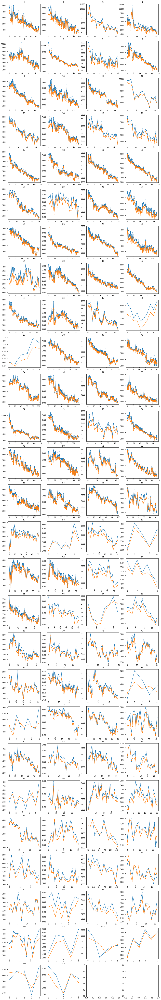

In [543]:
col1=14
col2=15
num_to_plot=len(spot_data)
def test(x):
    #plt.plot(spot_data[x][:,col1] / np.mean(spot_data[x][:,col1]), marker=".")
    #plt.plot(spot_data[x][:,col2] / np.mean(spot_data[x][:,col2]),marker=".") 
    plt.plot(spot_data[x][:,col1] , marker=".")
    plt.plot(spot_data[x][:,col2] ,marker=".") 
    plt.title(x)
imp.plot_ps(test, range(1,num_to_plot+1))

In [538]:
mv.spot_data[1].shape


(110, 12)

Looking through spot movies, it looks like there might be some effects from spots that find themselves at the nuclear periphery: if some pixels in the 'box' are outside the nucleus, you get artificially low Rpb1 signal. Want to try with a smaller box:

In [82]:
mv = sna_em3
#orig = mv.spot_data.copy()

nucchannel = 0
ij_rad = 2
z_rad = 1.1
ij_scale = 1
z_scale = 1

spot_data_new = imp.add_volume_mean(mv.spot_data, mv.stack, nucchannel, ij_rad, z_rad, ij_scale, z_scale)
prot_new = imp.movie.make_spot_table(spot_data_new, mv.nucmask, 12)
mv2 = imp.movie(mv.stack, mv.nucmask, mv.fits, mv.spot_data) # I should write a copy method...
mv2.prot = prot_new

10 20 30 40 50 60 70 80 90 100 

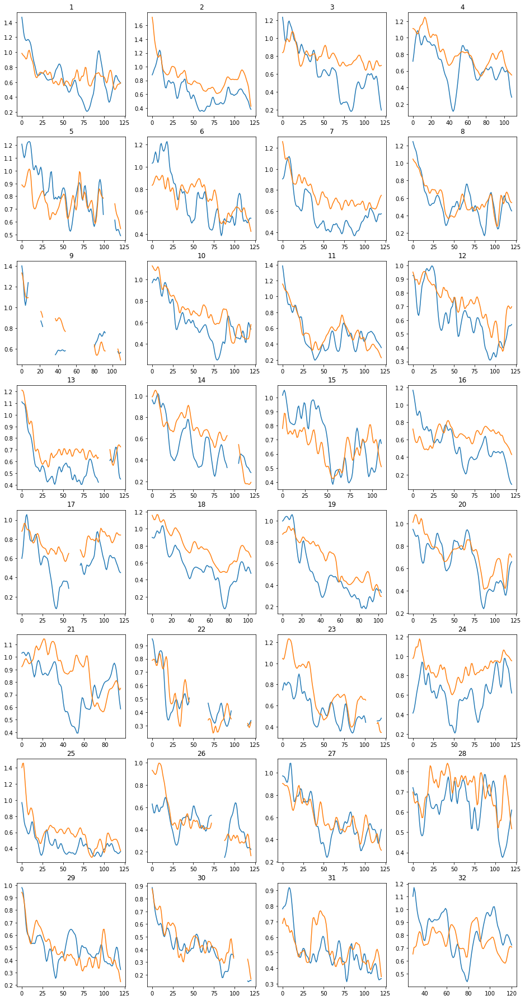

In [164]:
plot_traces(sna_em3, 100, 1.5)

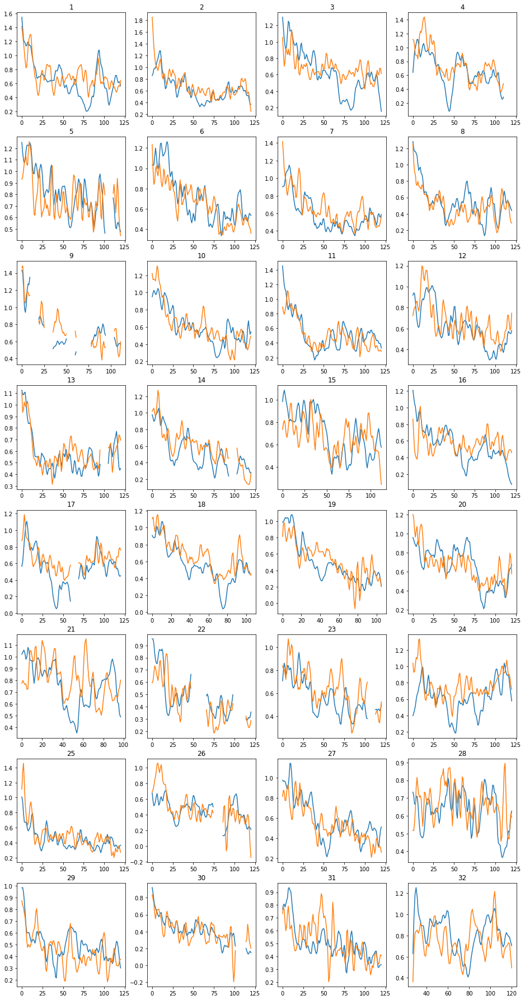

In [83]:
plot_traces(mv2, 100, 2)

Hmm...

This is noisier but maybe a little better? Worth trying at least.

I'd like to try this with triggered averaging, but I'd also like to modify find rises. Currently it normalizes each vector 0 to 1. I would like to normalize it to the overall data, so that we are looking at the largest absolute rises rather than the relative rises within traces.

In [160]:
def findrises_norm_all(df_in, windowsize, lag, minlen, min_, max_, sigma=1, rise=True, norm=True, display=False):
    """Find points in signal where a 'rise' occurs of magnitude between min_ and max_.
    Change is calculated using means within windows of specified size and with offset
    defined by lag. If rise is false, will look for falls. Norm normalizes each spot's
    data 0 to 1."""
    df = df_filter_trajlen(df_in, minlen)
    norm_lower, norm_upper = np.nanpercentile(df.to_numpy().flatten(), [5, 95])
    events = []
    for spot in df:
        data = pd.Series(ndi.gaussian_filter1d(df[spot], sigma))
        if (norm):
            data_norm = (data - norm_lower) / (norm_upper - norm_lower)
        else:
            data_norm = data
        rolling_avg = data_norm.rolling(windowsize, center=True).mean()
        diff = rolling_avg.diff(lag)
        
        if rise:
            indices = np.where((diff > min_) & (diff < max_))
        else:
            indices = np.where((diff < (-1 * min_)) & (diff > (-1 * max_)))
        
        for i in indices[0]:
            events.append([spot, i])
            
    if display:
        nframes = df.shape[1]
        ax = imp.qax(nframes+1)

        #for n in range(0, nframes-1):
        i = 0
        for n in df:
            ax[i].plot(df[n])
            for event in events:
                if (event[0] == n):
                    ax[i].axvline([event[1]], color="black", linestyle="--")
            i += 1
    print(len(events))
    return events



384


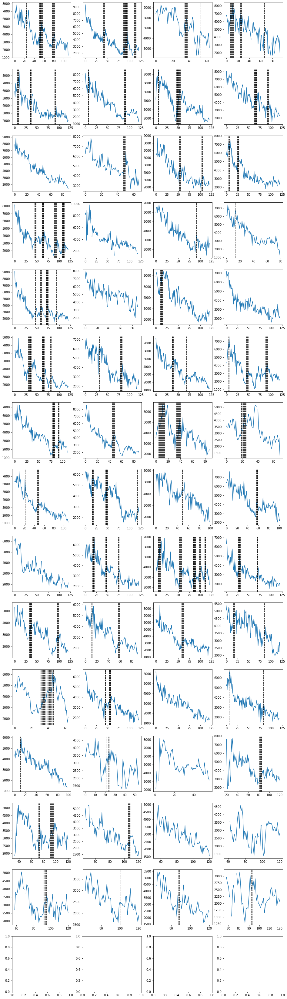

In [162]:
rises = findrises_norm_all(sna_em3.intvol, 5, 3, 50, 0.05, np.inf, sigma=2, norm=True, display=True)

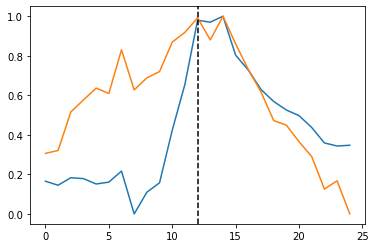

In [113]:
plot_triggered(sna_em3.intvol, sna_em3.prot, rises)

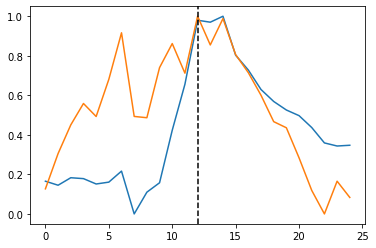

In [114]:
plot_triggered(sna_em3.intvol, prot_new, rises)

### Review

I think the normalization made a big difference. Using the overall mean rahter than normalizing each trace to itself, there seems to be a very clear correlation between the two signals. It's crude, but they plainly follow each other in broad strokes. The question is how to detect this quantitatively?

I think using a smaller integration window for the pol2 signal might help some things. It's a little unclear. One thing that is clear is that the calling of rises is insufficient at the moment. 

One option is to improve rise calling but I think switching to a more general method of looking at derivatives is actually better. I'm not sure what this looks like. Making derivatives with various windows and offsets and doing a cross-correlation? This seems like the right thing but I've had so little luck with cross-correlations. Idk I'll just dig in.

In [176]:
def df_deriv(df, windowsize, stepsize):
    return df.rolling(windowsize, center=True).mean().diff(stepsize)

In [907]:
def plot_traces2(df1, df2, stack, minlen, sigma=0.8, norm=True):
    """Plot individual traces with smoothing, bleach correction, and 
    a minimum trajectory length filter."""
    def norm_trace(df, x, lower, upper):
        return (df.iloc[:,x] - lower) / (upper - lower)
    def df_filter_trajlen(df, df_to_count, minlen):
        """Filter pandas df columns for minimum number of non-nan entries."""
        return  df.loc[:,df_to_count.apply(lambda x: np.count_nonzero(~np.isnan(x)), axis=0) > minlen]

    df1_processed = df_filter_trajlen(bleach_corr(df1, stack), df1, minlen)
    df2_processed = df_filter_trajlen(bleach_corr(df2, stack), df1, minlen)

    df1_lower, df1_upper = np.nanpercentile(df1_processed.to_numpy().flatten(), [5, 95])
    df2_lower, df2_upper = np.nanpercentile(df2_processed.to_numpy().flatten(), [5, 95])
    num_to_plot=df1_processed.shape[1]
    def test(x):
        if norm:
            plt.plot(ndi.gaussian_filter1d(norm_trace(df1_processed, x, df1_lower, df1_upper), sigma))
            plt.plot(ndi.gaussian_filter1d(norm_trace(df2_processed, x, df2_lower, df2_upper), sigma))
        else:
            plt.plot(ndi.gaussian_filter1d(df1_processed.iloc[:,x], sigma))
            plt.plot(ndi.gaussian_filter1d(df2_processed.iloc[:,x], sigma))
        plt.title(df1_processed.columns[x])
    imp.plot_ps(test, range(0,num_to_plot))

32


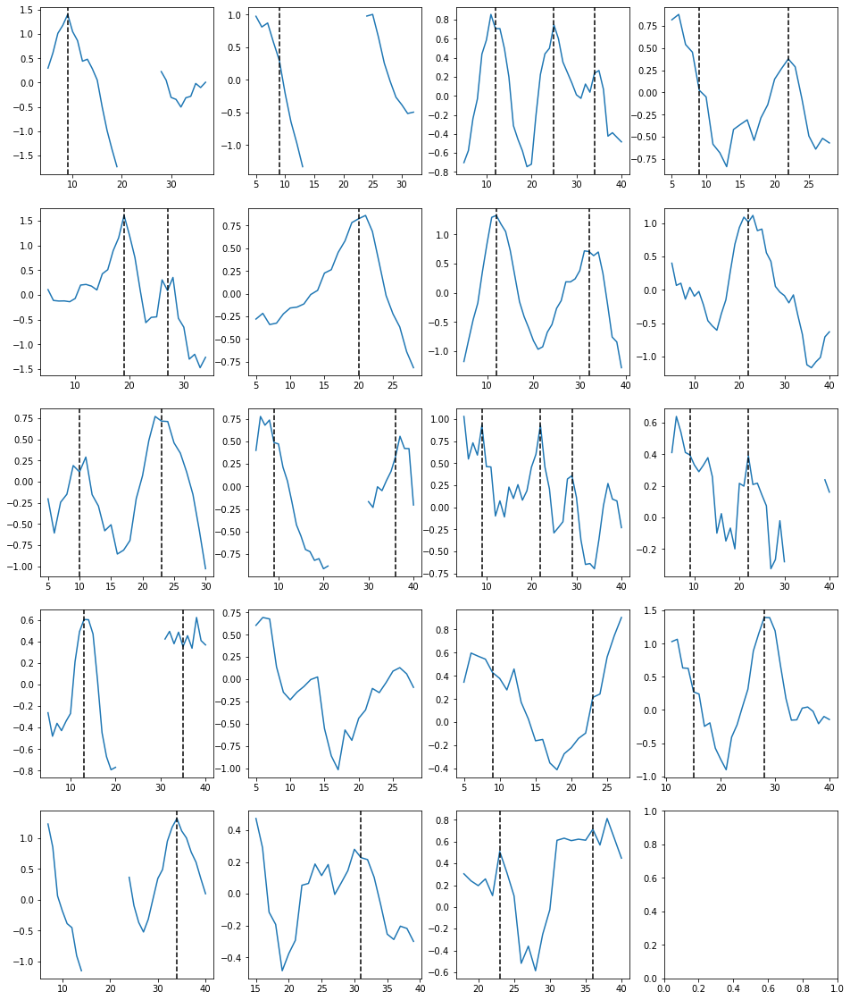

In [348]:
from imagep import get_object_centroid
def df_find_peaks_thresh(df, thresh, sigma=1, display=False):
    def norm_trace(df, x, lower, upper):
        return (df[x] - lower) / (upper - lower)
    
    events = []
    lower, upper = np.nanpercentile(df.to_numpy().flatten(), [5, 95])
    df_norm = df / upper
    for spot in df_norm:
        data = pd.Series(ndi.gaussian_filter1d(df_norm[spot], sigma))
        
        peakmask = np.where(data >= thresh, 1, 0)
        labelmask, _ = ndi.label(peakmask)
        for peak in np.unique(labelmask)[1:]:
            max_ = np.nanmax(data[labelmask == peak])
            if not np.isnan(max_):
                max_loc = np.where((labelmask == peak) & (data == max_))[0][0]
                #centroid = get_object_centroid(labelmask, peak)
                events.append([spot, max_loc])
    if display:
        nframes = df_norm.shape[1]
        ax = imp.qax(nframes+1)

        #for n in range(0, nframes-1):
        i = 0
        for n in df:
            ax[i].plot(df_norm[n])
            for event in events:
                if (event[0] == n):
                    ax[i].axvline([event[1]], color="black", linestyle="--")
            i += 1
    print(len(events))
    return events

peaks = df_find_peaks_thresh(intvol_der, 0.05, display=True)



In [335]:
data = np.array([0,0,0,1,1,2,1,0,0,0,0])
test = [0,0,0,1,1,1,1,0,0,0,0]
lmask, _ = ndi.label(test)
np.max(data[lmask == 1])
np.where((lmask == 1) & (data == 2))

(array([5]),)

In [269]:
intvol_der = df_deriv(sna_em3.intvol, 5, 3)
prot_der = df_deriv(sna_em3.prot, 5, 3)

439


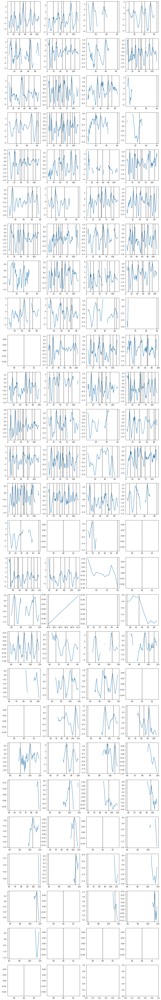

In [270]:
peaks = df_find_peaks_thresh(intvol_der, 0, display=True)

242


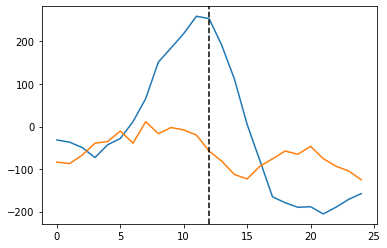

In [299]:
intvol_der = df_deriv(hb_em1.intvol, 5, 3)
prot_der = df_deriv(hb_em1.prot, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=False)
#plot_triggered(hb_em1.intvol, hb_em1.prot, peaks)

156


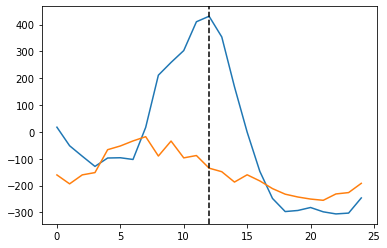

In [298]:
intvol_der = df_deriv(hb_em2.intvol, 5, 3)
prot_der = df_deriv(hb_em2.prot, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.5, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

352


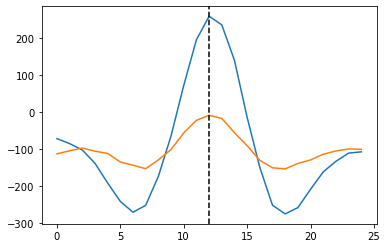

In [297]:
intvol_der = df_deriv(df_filter_trajlen(sna_em3.intvol, 50), 5, 3)
prot_der = df_deriv(df_filter_trajlen(sna_em3.prot, 50), 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0, display=False)
#plot_triggered(sna_em3.intvol, sna_em3.prot, peaks)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

In [499]:
#eve_4_1 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20180915-rpb1-eve-em4-zsmv-01-02.pkl')
#eve_4_4 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20180915-rpb1-eve-em4-zsmv-04-06.pkl')
#eve_4_7 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20180915-rpb1-eve-em4-zsmv-07.pkl')
sna_3_5 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20200825-rpb1Snams2-em1-zsmv-03-05.pkl')




98


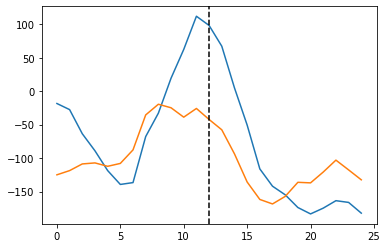

In [322]:
mv = eve_4_1
intvol_der = df_deriv(df_filter_trajlen(mv.intvol, 25), 5, 3)
prot_der = df_deriv(df_filter_trajlen(mv.prot, 25), 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
#plot_triggered(sna_em3.intvol, sna_em3.prot, peaks)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

64


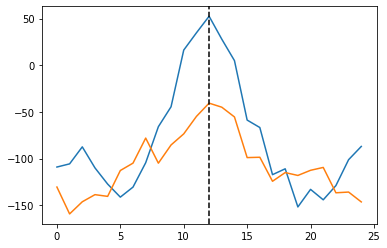

In [314]:
mv = eve_4_4
intvol_der = df_deriv(df_filter_trajlen(mv.intvol, 25), 5, 3)
prot_der = df_deriv(df_filter_trajlen(mv.prot, 25), 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0, display=False)
#plot_triggered(sna_em3.intvol, sna_em3.prot, peaks)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

50


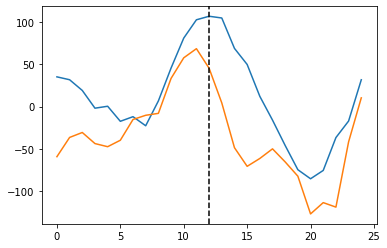

In [325]:
mv = eve_4_7
intvol_der = df_deriv(df_filter_trajlen(mv.intvol, 25), 5, 3)
prot_der = df_deriv(df_filter_trajlen(mv.prot, 25), 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0, display=False)
#plot_triggered(sna_em3.intvol, sna_em3.prot, peaks)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

I'm thinking that this peak calling isn't the way to go. It's messy and I don't think it captures the signal well. Let's revisit this.

I decided to go back to cross-correlation, but this time using the derivative signals. So, looking at the correlation of changes in the two signals. The treatment of the data is going to be important, of course. Currently, I am bleach correcting, filtering for a minimum trajectory length, and also deciding on how I take the difference. I'm using the mean over a window of size n and comparing positions m frames away (windowsize and step size). Presumably results will 

In [547]:
def make_padded_vectors(df1_in, df2_in, minlen=0, pad=100):
    """Take two matched (corresponding data from e.g. transcription and protein) data
    frames, concatenate the data from the dataframe columns with pads of zeros separating
    them, also create a matching control vector with 1s replacing the data vectors."""
    def df_filter_trajlen(df, df_to_count, minlen):
        """Filter pandas df columns for minimum number of non-nan entries."""
        return  df.loc[:,df_to_count.apply(lambda x: np.count_nonzero(~np.isnan(x)), axis=0) > minlen]
    df1 = df_filter_trajlen(df1_in, df1_in, minlen)
    df2 = df_filter_trajlen(df2_in, df1_in, minlen)
    v1 = np.zeros(pad)
    v2 = np.zeros(pad)
    control = np.zeros(pad)
    for n in df1:
        v1 = np.concatenate([v1, df1[n], np.zeros(pad)])
        v2 = np.concatenate([v2, df2[n], np.zeros(pad)])
        control = np.concatenate([control, np.ones(len(df1[n])), np.zeros(pad)])
    return (v1, v2, control)

In [671]:
#mv = eve_4_
def df_cross_corr_intvol_prot(mv, window=5, step=3, minlen=0, pad=30, plot=True, spread=20, bleach_correct=True):
    if bleach_correct:
        df1 = df_deriv(bleach_corr(mv.prot, mv.stack[0]), window, step)
        df2 = df_deriv(bleach_corr(mv.intvol, mv.stack[0]), window, step)
    else:
        df1 = df_deriv(mv.prot, window, step)
        df2 = df_deriv(mv.intvol, window, step)
    v1, v2, c = make_padded_vectors(df1, df2, minlen, pad)
    v1[np.isnan(v1)] = 0
    v2[np.isnan(v2)] = 0
    crosscorr_norm = np.correlate(v1, v2, 'same') / np.correlate(c, c, 'same')
    spread = 20
    crosscorr_norm = crosscorr_norm / np.max(crosscorr_norm)
    midpoint = int(len(crosscorr_norm) / 2)
    data = crosscorr_norm[(midpoint - spread):(midpoint + spread)]
    plt.plot(data, marker=".")
    plt.axvline(spread, alpha=0.3, color="orange")
    return crosscorr_norm

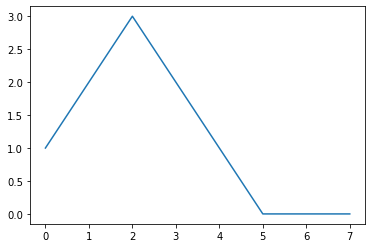

In [561]:
# Which way is which? 
# Answer: if protein signal is given to np.correlate in the first argument,
# a high cross-correlation to the left means that the protein signal leads
# the other signal. 
simprot = [0,0,1,1,1,0,0,0]
simintvol =  [0,0,0,0,1,1,1,0]
plt.plot(np.correlate(simprot, simintvol, 'same'))

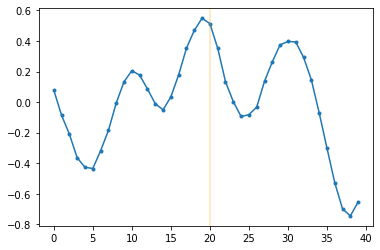

In [583]:
d = df_cross_corr_intvol_prot(hb_em1, minlen=30, window=5, step=3)

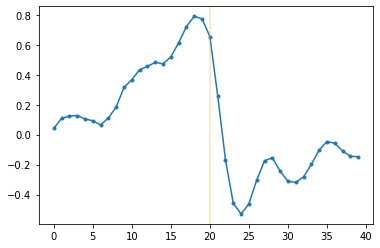

In [584]:
d = df_cross_corr_intvol_prot(hb_em2, minlen=30, window=5, step=3)

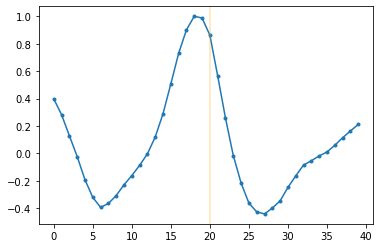

In [585]:
d = df_cross_corr_intvol_prot(eve_4_1, minlen=30, window=5, step=3)

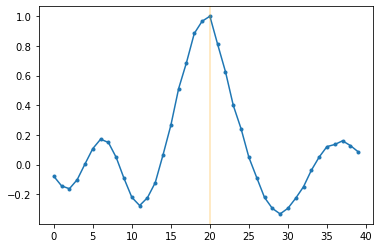

In [586]:
d = df_cross_corr_intvol_prot(eve_4_4, minlen=30, window=5, step=3)

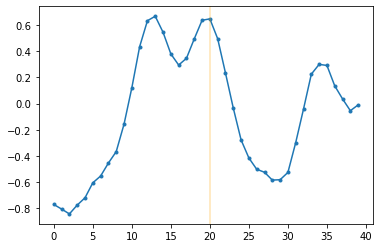

In [587]:
d = df_cross_corr_intvol_prot(eve_4_7, minlen=30, window=5, step=3)

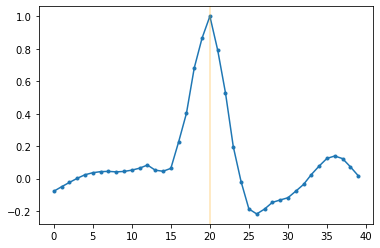

In [588]:
d = df_cross_corr_intvol_prot(sna_em3, minlen=30, window=5, step=3)

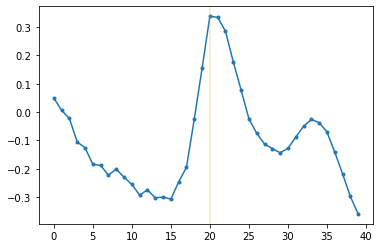

In [589]:
d = df_cross_corr_intvol_prot(sna_3_5, minlen=30, window=5, step=3)

In [599]:
sna_7_9 = load_pickle('/Users/michaelstadler/Bioinformatics/Projects/rpb1/results/20200825-rpb1Snams2-em1-zsmv-07-09.pkl')

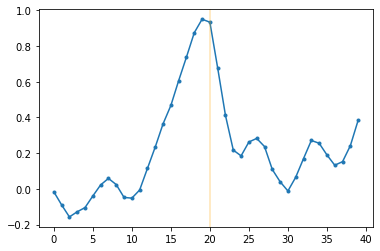

In [600]:
d = df_cross_corr_intvol_prot(sna_7_9, minlen=30, window=5, step=3)

### What's this?

Hard to know what to make of these. There's clearly a left-bias to them, suggesting a (predicted) correlation between changes in the transcription signal and changes in the protein signal at prior time points. But the shapes are irregular. We would prefer to see something clean, like a nice peak at -60 seconds or so. It is worth mentioning that the frame intervals on these movies are similar, but not identical. I also wonder if there is some data trimming that would be useful. There are significant differences in time point (early vs. late nc14), bleaching, etc. Basically, I feel like being really careful with the data is probably useful. Maybe I'll try working hard on one movie and see what I can get.


In [607]:
viewer(eve_4_1.stack)

interactive(children=(Dropdown(description='Color', index=4, options=('magma', 'gray', 'cividis', 'viridis', '…

In [608]:
prot_orig = eve_4_1.prot

In [724]:
mv = eve_4_1
ij_rad = 25
z_rad = 1.1
ij_scale = 1
z_scale = 1
protchannel = 0
spotchannel=1

spot_data = imp.add_volume_mean(mv.spot_data, mv.stack, protchannel, ij_rad, z_rad, ij_scale, z_scale)
prot_25 = imp.movie.make_spot_table(spot_data, mv.nucmask, 12)

#spot_data = imp.add_volume_mean(mv.spot_data, mv.stack, spotchannel, ij_rad, z_rad, ij_scale, z_scale)
#intvol_10 = imp.movie.make_spot_table(spot_data, mv.nucmask, 12)

10 20 30 40 50 60 70 80 90 

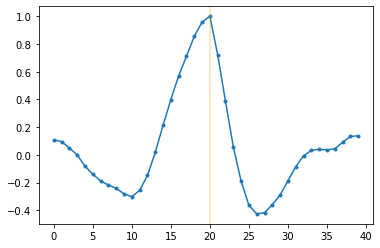

In [719]:
mv.intvol = intvol_5
mv.prot = prot_2
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3)

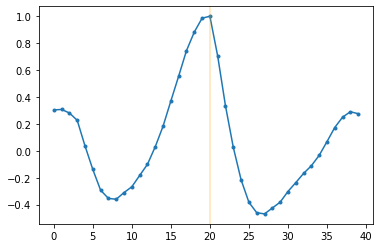

In [723]:
mv.intvol = intvol_5
mv.prot = prot_10
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3)

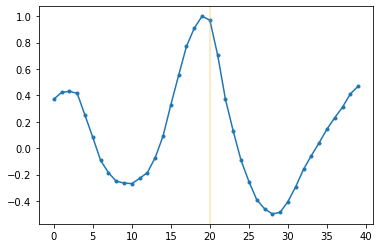

In [725]:
mv.intvol = intvol_5
mv.prot = prot_25
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3)

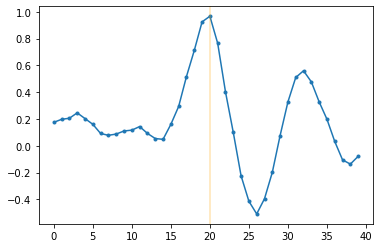

In [722]:
mv.intvol = intvol_5
mv.prot = prot_100
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3, bleach_correct=False)

Ok, I thought maybe it was an artifact of the bleach corrections. It's not.

59


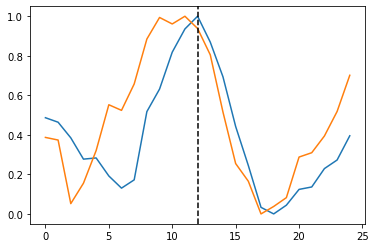

In [708]:
intvol_der = df_deriv(intvol_5, 5, 3)
prot_der = df_deriv(prot_2, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.1, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

In [817]:
reload(imp)
mv = hb_em2
ij_rad = 2
z_rad = 1.1
ij_scale = 1
z_scale = 1
protchannel = 0
spotchannel=1

spot_data = imp.add_volume_mean(mv.spot_data, mv.stack, protchannel, ij_rad, z_rad, ij_scale, z_scale)
hb_em2_prot_2_v2 = imp.movie.make_spot_table(spot_data, mv.nucmask, 12)



booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booy

booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booya
booy

45


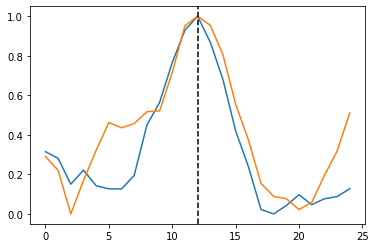

In [707]:
intvol_der = df_deriv(eve_4_4.intvol, 5, 3)
prot_der = df_deriv(eve_4_4_prot_2, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

30


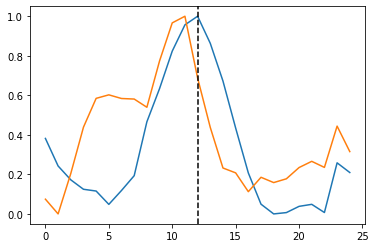

In [706]:
intvol_der = df_deriv(eve_4_7.intvol, 5, 3)
prot_der = df_deriv(eve_4_7_prot_2, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.2, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

169


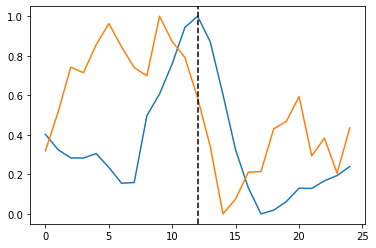

In [705]:
intvol_der = df_deriv(hb_em2.intvol, 5, 3)
prot_der = df_deriv(hb_em2_prot_2, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

50


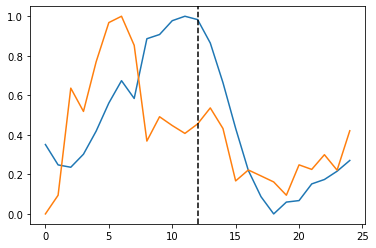

In [704]:
intvol_der = df_deriv(hb_em1.intvol.iloc[:40,], 5, 3)
prot_der = df_deriv(hb_em1_prot_2.iloc[:40,], 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

68


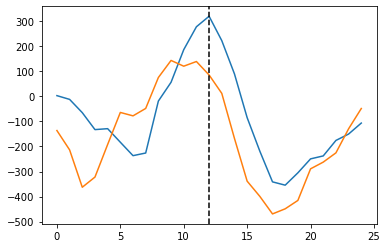

In [717]:
intvol_der = df_deriv(eve_4_1.intvol, 5, 3)
prot_der = df_deriv(eve_4_1_prot_2, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

68


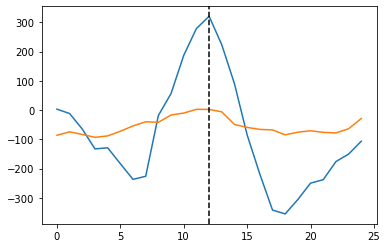

In [718]:
intvol_der = df_deriv(eve_4_1.intvol, 5, 3)
prot_der = df_deriv(eve_4_1_prot_25, 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=False)

Alright so it seems like a smaller radius for the protein signal is important, but also why the fuck do I see the cross correlation with the radius of 100? 

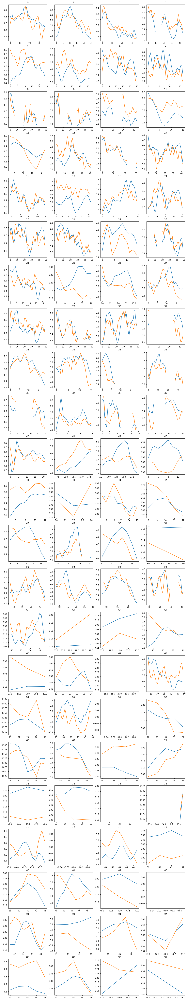

In [763]:
plot_traces2(eve_4_1.intvol, prot_2,eve_4_1.stack[0], 0, sigma=0.8)

In [760]:
imp.quickview_ms2(eve_4_1.stack, eve_4_1.spot_data, spot_id=3, channel=0, halfwidth_xy=7, MAX=False, halfwidth_z=0)

interactive(children=(Dropdown(description='Color', index=2, options=('magma', 'gray', 'cividis', 'viridis', '…

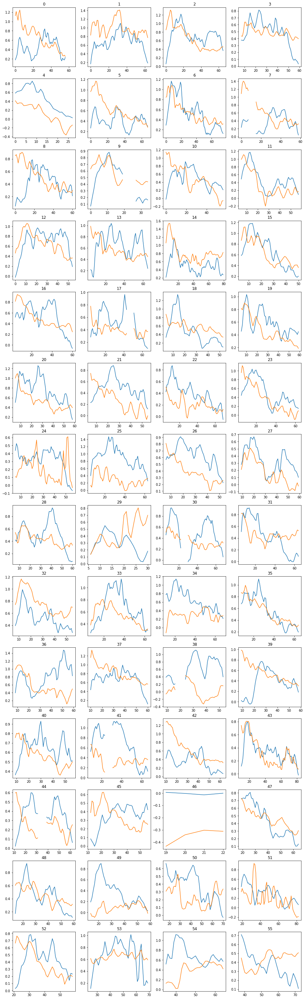

In [771]:
plot_traces2(hb_em2.intvol, hb_em2_prot_50, hb_em2.stack[0], 30, sigma=0.8)

In [795]:
imp.quickview_ms2(hb_em1.stack, hb_em1.spot_data, spot_id=28, channel=1, halfwidth_xy=7, MAX=False, halfwidth_z=0)

interactive(children=(Dropdown(description='Color', index=2, options=('magma', 'gray', 'cividis', 'viridis', '…

### What about Z plane effects?

Could the Z plane (scattering) effect I observed with the 120-mers be influencing these data? I want to plot Z plane against these signals.

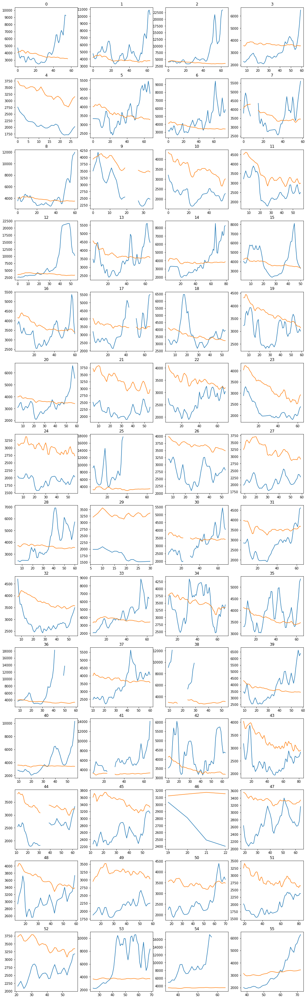

In [793]:
mv = hb_em2
#hb_em2_zslices = imp.movie.make_spot_table(mv.spot_data, mv.nucmask, 2)

plot_traces2((hb_em2_zslices ** -1) * 20000 , hb_em2_prot_100, hb_em2.stack[0], 30, sigma=0.8, norm=False)

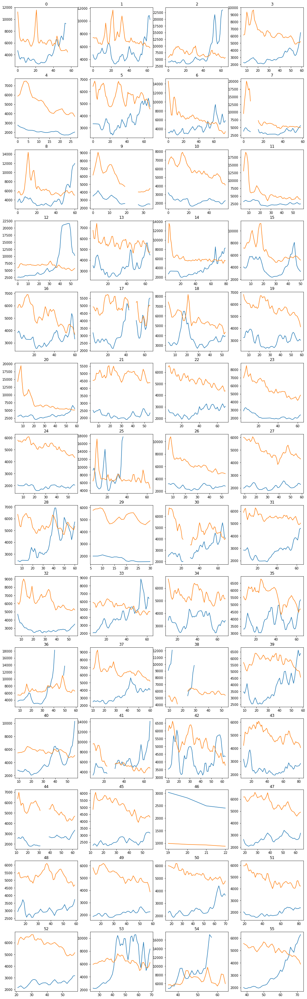

In [794]:
plot_traces2((hb_em2_zslices ** -1) * 20000 , hb_em2.prot, hb_em2.stack[0], 30, sigma=0.8, norm=False)

While there may be subtle things in here, nothing convinces me that the Z location is a significant factor in the protein signal. So the fact remains: the cross-correlation suggests there's some temporal relationship between the MS2 signal and the protein signal at previous frames, but this relationship exists for small and large radii of protein integration. Seems to suggest that the protein signal in the whole nucleus or part of hte nucleus is doing something? An obvious candidate here is bleach correction (perhaps HLBs drifting in and out of focus?) but the cross-correlation effect persists in the absence of bleach correction. Maybe it's the opposite, insufficient correction of bleaching? Not sure why that'd give you a lagged correlation.



In [857]:
reload(imp)
mv = hb_em2
ij_rad = 200
z_rad = 2
ij_scale = 1
z_scale = 1
protchannel = 0
spotchannel=1

spot_data = imp.add_volume_mean(mv.spot_data, mv.stack, protchannel, ij_rad, z_rad, ij_scale, z_scale)
hb_em2_prot_200_2 = imp.movie.make_spot_table(spot_data, mv.nucmask, 12)

10 20 30 40 50 60 70 80 

In [903]:
mv = hb_em2
ms2 = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=2)
prot = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=2)
viewer([ms2, prot], 5, order='stxy', color="cividis")

interactive(children=(Dropdown(description='Color', index=2, options=('magma', 'gray', 'cividis', 'viridis', '…

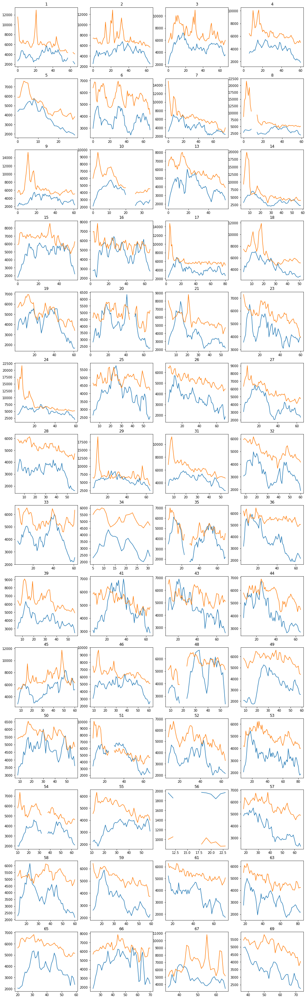

In [908]:
plot_traces2(hb_em2.intvol, hb_em2.prot, hb_em2.stack[0], 30, sigma=0.6, norm=False)

In [904]:
mv = eve_4_1
ms2 = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=2)
prot = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=2)
viewer([ms2, prot], 5, order='stxy', color="cividis")

interactive(children=(Dropdown(description='Color', index=2, options=('magma', 'gray', 'cividis', 'viridis', '…

It's obvious that a significant issue with the hunchback data is the HLB. Bascially all of the peaks over ~8000 in intensity are from HLB interactions. I suspect this is worse for hb and sna because those constructs are inserted on 2, which also has the histone locus. Eve is on 3, and seems to fare a little better. It also seems that the HLB interactions fade later in nc14, which make sense as the chromosomes adopt a more rigid apical-basal polarity that will keep the locus from crossing the HLB. One option is to just slice the data (and in the future, collecte the data) after the initial part of nc14. 

60


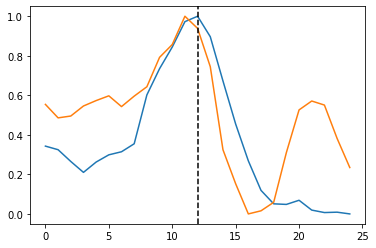

In [963]:
intvol_der = df_deriv(hb_em1.intvol.iloc[30:,], 5, 3)
prot_der = df_deriv(hb_em1_prot_2.iloc[30:,], 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.1, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

This seems to clean things up considerably. It doesn't look like the long sna movie has a ton of this problem:

In [913]:
mv = sna_em3
ms2 = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=1)[:,:,2:5].mean(axis=2)
prot = imp.spot_movies(mv.stack, mv.spot_data, len_ij=31, fill=0, channel=0)[:,:,2:5].mean(axis=2)
viewer([ms2, prot], 5, order='stxy', color="cividis")

interactive(children=(Dropdown(description='Color', index=2, options=('magma', 'gray', 'cividis', 'viridis', '…

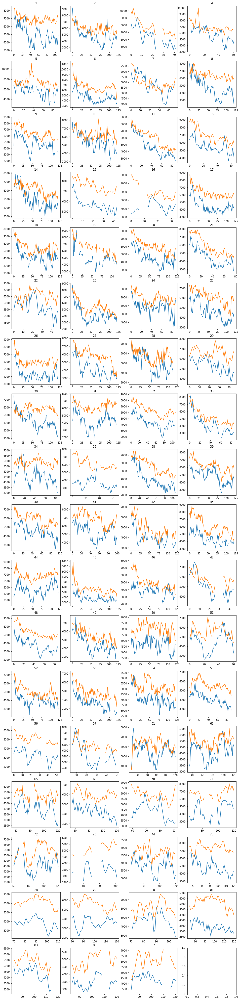

In [914]:
plot_traces2(sna_em3.intvol, sna_em3.prot, sna_em3.stack[0], 30, sigma=0.6, norm=False)

225


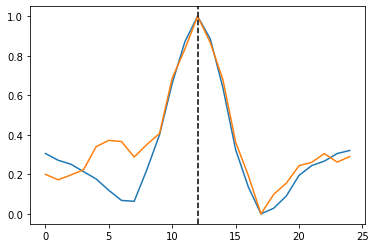

In [918]:
intvol_der = df_deriv(sna_em3.intvol.iloc[30:,], 5, 3)
prot_der = df_deriv(sna_em3.prot.iloc[30:,], 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.1, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

102


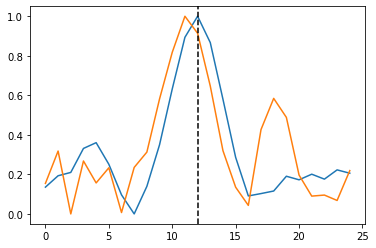

In [923]:
intvol_der = df_deriv(sna_7_9.intvol.iloc[1:,], 5, 3)
prot_der = df_deriv(sna_7_9.prot.iloc[1:,], 5, 3)
peaks = df_find_peaks_thresh(intvol_der, 0.0, display=False)
plot_triggered(intvol_der, prot_der, peaks, norm=True)

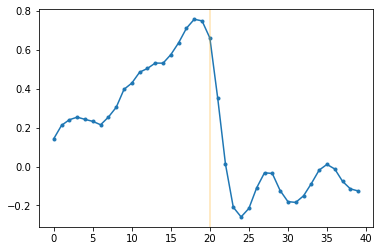

In [927]:
mv.intvol = hb_em2.intvol
mv.prot = hb_em2.prot
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3, bleach_correct=False)

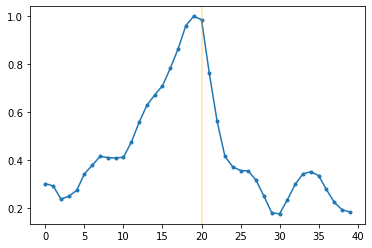

In [926]:
mv.intvol = hb_em2.intvol.iloc[30:,]
mv.prot = hb_em2.prot.iloc[30:,]
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3, bleach_correct=False)

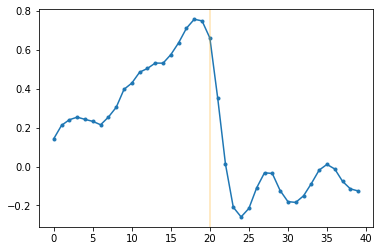

In [928]:
mv.intvol = sna_em3.intvol
mv.prot = sna_em3.prot
d = df_cross_corr_intvol_prot(mv, minlen=20, window=5, step=3, bleach_correct=False)

Could this just be a product of overall signal increaseds and decreases? As in, perhaps despite bleach correction one signal is ascending and the other is decreasing, and the convolution gives the left bias?

In [943]:
a = np.arange(0,100)
b = np.arange(0,50,0.5)[::-1]

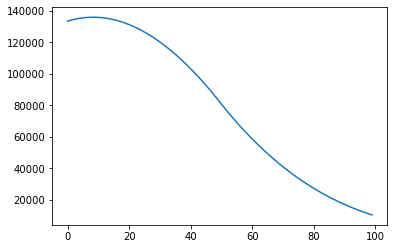

In [945]:
plt.plot(np.correlate(b,a, 'same'))

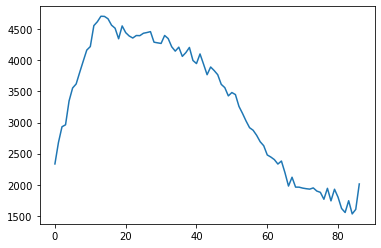

In [957]:
plt.plot(hb_em2.intvol.mean(axis=1))

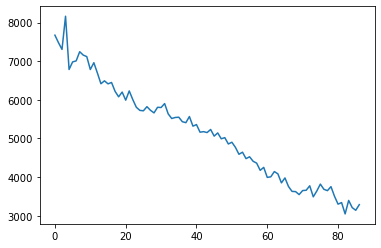

In [958]:
plt.plot(hb_em2.prot.mean(axis=1))

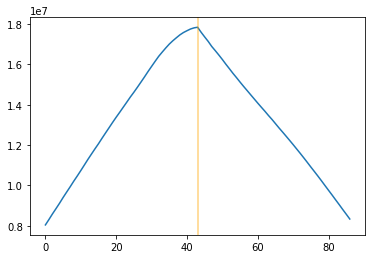

In [962]:
a = hb_em2.intvol.mean(axis=1)
b = hb_em2.prot.mean(axis=1)
plt.plot(np.correlate(b,a, 'same') / np.correlate(np.ones_like(a), np.ones_like(b)))
midpoint = int(len(a) / 2)
plt.axvline(midpoint, color='orange', alpha=0.5)

Hmm, this last one is tantalizing. That looks like the modest left bias of the type I've been seeing. 